## Load the an image

In [2]:
!pip install opencv-python-headless



  Using cached opencv_python_headless-4.10.0.84-cp37-abi3-win_amd64.whl.metadata (20 kB)
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB 162.5 kB/s eta 0:03:59
   ---------------------------------------- 0.0/38.8 MB 163.8 kB/s eta 0:03:57
   ---------------------------------------- 0.1/38.8 MB 238.1 kB/s eta 0:02:43
   ---------------------------------------- 0.1/38.8 MB 327.3 kB/s eta 0:01:59
   ---------------------------------------- 0.1/38.8 MB 462.0 kB/s eta 0:01:24
   ---------------------------------------- 0.2/38.8 MB 562.0 kB/s eta 0:01:09
   ---------------------------------------- 0.3/38.8 MB 682.7 kB/s eta 0:00:57
   ---------------------------------------- 0.4/38.8 MB 825.0 kB/s eta 0:00:47
   ---------------------------------------- 0.4/38.8 MB 813.8 kB/s eta 0:00:48
   ---------------------------------------- 0.5/38.8 MB 942.

In [3]:
from PIL import Image
import cv2  # to read images
import matplotlib.pyplot as plt  # to display images
import copy  # to crete a deep copy of images
import numpy as np

 - Avoid system errors

In [5]:
import warnings
warnings.simplefilter("ignore")

- Path iamge 

In [7]:
path_image = "images/leon.jpeg"

In [8]:
image = Image.open(path_image) 

In [9]:
IMG = np.array(image)

 - Testing Show

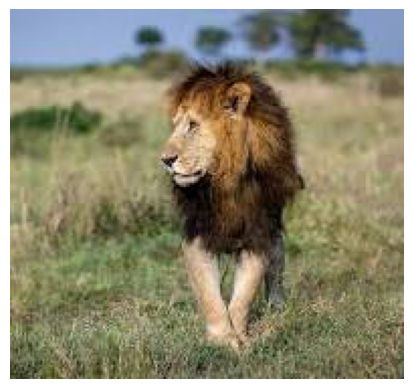

In [11]:
import matplotlib.pyplot as plt

plt.imshow(IMG ,cmap='gray')
plt.axis("off") 
plt.show()

## Determine the pixel resolution of IMG

In [13]:
print(f' Image Width: {len(IMG[0])}, Height: {len(IMG)}')

 Image Width: 195, Height: 183


In [14]:
def getHeight(image):
    return len(image)


def getWidth(image):
    return len(image[0])


def getColorChannels(image):
    return len(image[0][0])


def blank(height, width):
    return [[0 for i in range(width)] for j in range(height)]


def getCount(image, value):
    m = getHeight(image)
    n = getWidth(image)
    count = 0
    for i in range(m):
        for j in range(n):
            if image[i][j] == value:
                count += 1
    return count

## Show the RGB values of the pixel IMG(10, 15)

In [16]:
print(f'RGB values of the pixel IMG(10, 15) is  {IMG[10][15]}')

RGB values of the pixel IMG(10, 15) is  [146 169 210]


## Calculate the brightness of IMG

In [18]:
def calculate_brightness(IMG ,img_height , img_width  ):
    brightness_values = [] 
    for i in range(0 , img_height) : 
        for j in range(0 , img_width) : 
            brightness = (IMG[i][j][0] + IMG[i][j][1] + IMG[i][j][2]) / 3
            brightness_values.append(brightness)
            
    average_brightness = sum(brightness_values) / (img_height * img_width )
    
    return  average_brightness , brightness_values

In [19]:
average_brightness ,brightness_values = calculate_brightness(IMG,len(IMG),len(IMG[0]))

print(f'Average Brightness: {average_brightness}')
print(f' Brightness values : {brightness_values[:8]}')

Average Brightness: 41.55306151043873
 Brightness values : [82.66666666666667, 82.66666666666667, 82.66666666666667, 82.66666666666667, 83.66666666666667, 83.66666666666667, 84.66666666666667, 84.66666666666667]


## Calculate the contrast of IMG

In [21]:
import math 

def calculate_contrast(average_brightness , brightness_values , N , M) : 
    
    contrast_sum = 0
    for brightness in brightness_values:
        
        contrast_sum += (brightness - average_brightness) ** 2
        
    contrast  =  math.sqrt(contrast_sum / (M * N))
    
    return contrast
    

In [22]:
print(f'Contrast: {calculate_contrast(average_brightness , brightness_values ,len(IMG[0]),len(IMG) )}')

Contrast: 24.60028387355838


## Show the each of the RGB channels separately

In [24]:
def rgb_matrix(IMG , img_height , img_width  ) : 
    
    R_matrix = []
    G_matrix = []
    B_matrix = []
    
    for i in range(0 , img_height) :
        R_row = []
        G_row = []
        B_row = []
        for j in range(0 , img_width) :
            R_row.append(IMG[i][j][0])
            G_row.append(IMG[i][j][1])
            B_row.append(IMG[i][j][2])
        
        R_matrix.append(R_row)
        G_matrix.append(G_row)
        B_matrix.append(B_row)
    
    return R_matrix , G_matrix , B_matrix

In [25]:
R_matrix , G_matrix , B_matrix = rgb_matrix(IMG , len(IMG) , len(IMG[0])  )

 - Testin Show image in channel Blue

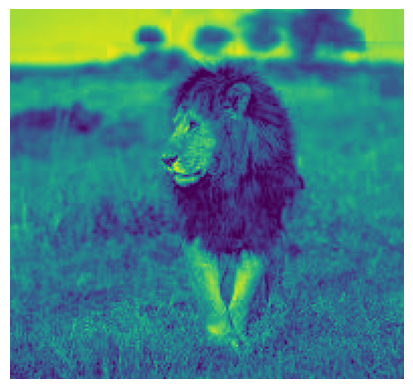

In [27]:
plt.imshow(B_matrix)
plt.axis("off") 
plt.show()

## Convert IMG to gray-level using the average method

In [205]:
def gray_level(IMG , img_height , img_width  ) :
    
    Gray_matrix = []
    for i in range(0 , img_height) :
        Gray_row = []
        for j in range(img_width):
            R = IMG[i][j][0]
            G = IMG[i][j][1]
            B = IMG[i][j][2]
            Gray = int( (R + G + B) / 3 )
            Gray_row.append(Gray)
        Gray_matrix.append(Gray_row)
    return Gray_matrix
def grayLevelAverageMethod(image):
    m = getHeight(image)
    n = getWidth(image)
    o = getColorChannels(image)
    grayImage = list()
    for i in range(m):
        grayImage.append([])
        for j in range(n):
            colorSum = 0
            for k in range(o):
                colorSum += image[i][j][k]
            grayImage[i].append(colorSum / 3)
    
    return grayImage

In [30]:
Gray_matrix = gray_level(IMG , len(IMG) , len(IMG[0])  )

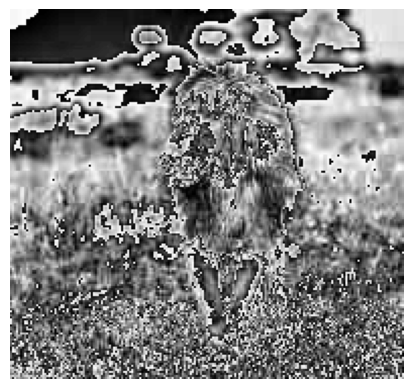

In [31]:
plt.imshow(Gray_matrix , cmap='gray')
plt.axis("off") 
plt.show()

## Convert IMG to gray-level using the weighted formula

In [33]:
def gray_level_two(IMG , img_height , img_width  ) :
    
    Gray_matrix = []
    for i in range(0 , img_height) :
        Gray_row = []
        for j in range(0 , img_width):
            R = IMG[i][j][0]
            G = IMG[i][j][1]
            B = IMG[i][j][2]
            Gray = int((R * 0.29) +( G * 0.6) + (B * 0.11))
            Gray_row.append(Gray)
        Gray_matrix.append(Gray_row)
    return Gray_matrix

In [34]:
IMG_2 = gray_level_two(IMG , len(IMG) , len(IMG[0])   )

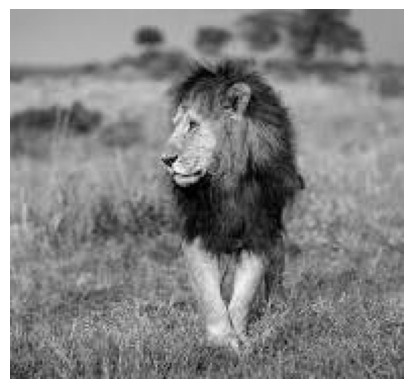

In [35]:
plt.imshow(IMG_2 , cmap='gray') # cmap='gray' View the image with grey grades
plt.axis("off") 
plt.show()

## Convert gray Level Using Python instruction

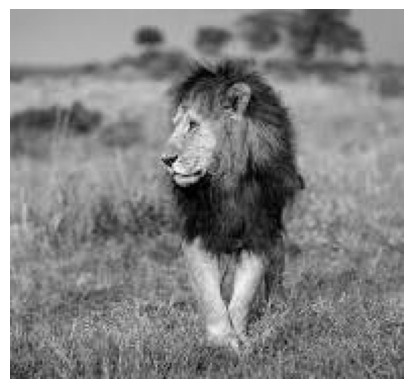

In [37]:
IMG2 = np.mean(IMG, axis=2)

plt.imshow(IMG_2 , cmap='gray') # cmap='gray' View the image with grey grades
plt.axis("off") 
plt.show()

## Determine the min / max value of IMG and IMG2

In [39]:
def min_max(img):
    min_val = IMG[0][0][0]
    max_val = IMG[0][0][0]
    
    for row in IMG :
        for pixel in row :
            for channel in pixel :  
                if channel < min_val :
                    min_val = channel
                if channel > max_val :
                    max_val = channel
    
    return min_val, max_val

In [40]:
def getMinMaxIntensity(image):
    m = getHeight(image)
    n = getWidth(image)
    max = image[0][0]
    min = image[0][0]
    for i in range(m):
        for j in range(n):
            if max < image[i][j]:
                max = image[i][j]
            if min > image[i][j]:
                min = image[i][j]

    return min, max

In [41]:
print("IMG min / max:", min_max(IMG))
print("IMG2 min / max:", min_max(IMG_2))

IMG min / max: (0, 255)
IMG2 min / max: (0, 255)


## Calculate the pixel resolution of IMG and IMG2 in terms of MegaPixel 

In [43]:
def mega_pixel(img_height, img_width):
    total_pixels = img_height * img_width
    megapixels = total_pixels / 1000000  
    return megapixels

In [44]:
print("IMG resolution in MP:", mega_pixel(len(IMG) , len(IMG[0])) )
print("IMG2 resolution in MP:", mega_pixel(len(IMG_2) , len(IMG_2[0])) )

IMG resolution in MP: 0.035685
IMG2 resolution in MP: 0.035685


## Calculate the size of IMG

In [46]:
def image_size(img_height, img_width, channels, bit_depth=8):
    size_in_bytes = img_height * img_width * channels * (bit_depth // 8)
    return size_in_bytes

In [47]:
print("IMG size in bytes:", image_size(len(IMG) , len(IMG[0]), 3))

IMG size in bytes: 107055


## SUB_IMG the sub-image from IMG  line 50 to 70 & column 20 to 90. Display the two images

In [49]:
SUB_IMG = IMG[50: 70, 20:90]

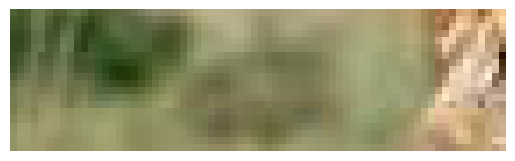

In [50]:
plt.imshow(SUB_IMG)
plt.axis("off") 
plt.show()

----

## Quantize IMG2 to 128, 64, 32 levels then display it.

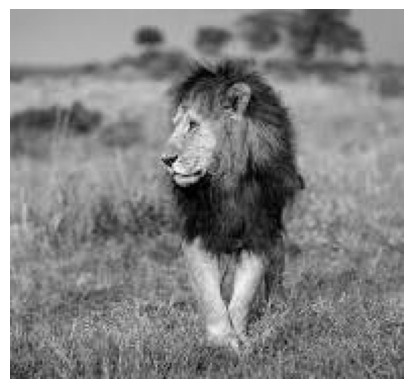

In [53]:
plt.imshow(IMG_2 ,  cmap='gray')
plt.axis("off" ) 
plt.show()

In [54]:
IMG_2 = np.array(IMG_2)

In [55]:
IMG_2

array([[159, 159, 159, ..., 153, 153, 153],
       [159, 159, 159, ..., 153, 153, 153],
       [159, 159, 159, ..., 153, 153, 153],
       ...,
       [ 48,  44,  63, ...,  79, 112,  85],
       [ 72,  85,  66, ...,  77,  99,  80],
       [ 70, 100,  84, ...,  84,  83,  60]])

In [56]:
def find_closest_value(gray_value, levels_list):
    closest_value = levels_list[0]  
    smallest_difference = abs(gray_value - closest_value)  

    for value in levels_list[1:]:  
        difference = abs(gray_value - value)
        if difference < smallest_difference:
            closest_value = value 
            smallest_difference = difference 

    return closest_value

In [57]:
def quantize(Gray_matrix , levels_list) : 
        
    quantized_matrix = []
        
    for row in Gray_matrix:
        quantized_row = []
        for gray_value in row:

            closest_value = find_closest_value(gray_value, levels_list)

            quantized_row.append(closest_value)
            
        quantized_matrix.append(quantized_row)
    
    
    return quantized_matrix

    

In [58]:
New_IMG_2 = quantize(IMG_2 , [32 , 64 , 128])


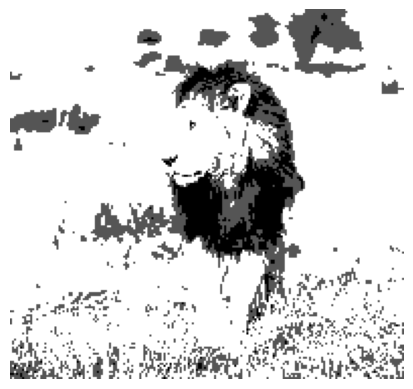

In [59]:
plt.imshow(New_IMG_2 ,  cmap='gray')
plt.axis("off" ) 
plt.show()

## Convert RGB image  to the different color spaces HSV,CMYK and YCbCr

In [62]:
def rgb_to_cmyk(IMG ,  img_height , img_width ):

    cmyk_image = list()
    for i in range(img_height):
        cmyk_image.append([])
        for j in range(img_width):
            r, g, b = IMG[i][j]
            r, g, b = r / 255, g / 255, b / 255

            k = 1 - max(r, g, b)
            c = (1 - r - k) / (1 - k)
            m = (1 - g - k) / (1 - k)
            y = (1 - b - k) / (1 - k)

            cmyk_image[i].append(
                [round(c * 100), round(m * 100), round(y * 100), round(k * 100)]
            )

    return cmyk_image

In [63]:
def rgb_to_hsv(IMG ,  img_height , img_width ):

    hsv_image = list()
    for i in range(img_height):
        hsv_image.append([])
        for j in range(img_width):
            r, g, b = IMG[i][j]
            r, g, b = r / 255, g / 255, b / 255

            cmax = max(r, g, b)
            cmin = min(r, g, b)
            delta = cmax - cmin

            if delta == 0:
                h = 0
            elif cmax == r:
                h = 60 * (((g - b) / delta) % 6)
            elif cmax == g:
                h = 60 * (((b - r) / delta) + 4)
            elif cmax == b:
                h = 60 * (((r - g) / delta) + 2)

            if cmax == 0:
                s = 0
            else:
                s = delta / cmax

            hsv_image[i].append([h, s, cmax])

    return hsv_image

In [64]:
def rgb_to_YCbCr(IMG,  img_height , img_width):

    ycbcr = list()
    for i in range(img_height):
        ycbcr.append([])
        for j in range(img_width):
            r, g, b = IMG[i][j]
            y = 0.299 * r + 0.587 * g + 0.114 * b
            cb = 0.564 * (b - y) + 128
            cr = 0.713 * (r - y) + 128

            ycbcr[i].append([y, cb, cr])

    return ycbcr

In [65]:
"""


"""

'\n\n\n'

### 15 |   Binarizing IMG2 according to 10, 50, 125, 25 as threshold

In [67]:
import copy
def binarize(IMG,  img_height , img_width, threshold):

    
    result = copy.deepcopy(IMG)
    for i in range(img_height):
        for j in range(img_width):
            if result[i][j] > threshold:
                result[i][j] = 255
            else:
                result[i][j] = 0
    return result

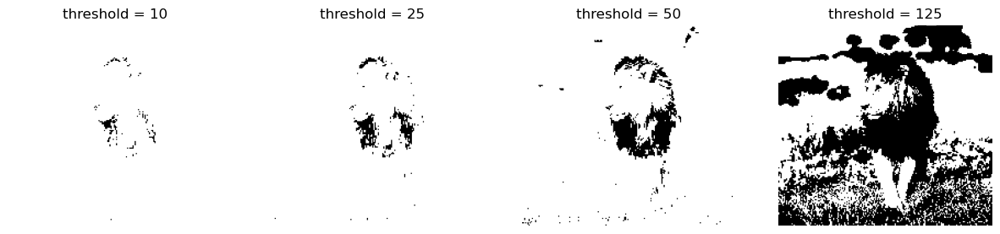

In [68]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

fig, ax = plt.subplots(1, 4)

thresholds = [10, 25, 50, 125]
for i, threshold in enumerate(thresholds):
    ax[i].imshow(binarize(IMG_2, len(IMG_2), len(IMG_2[0]), threshold=threshold), cmap="gray")
    ax[i].set_title(f"threshold = {threshold}")
    ax[i].axis("off")  


fig.set_size_inches(15, 5)
plt.show()


## 16|  Complementary image of IMG2 and its binarized version

In [70]:
def compliment(IMG,  img_height , img_width):

    result = copy.deepcopy(IMG)
    for i in range(img_height):
        for j in range(img_width):
            result[i][j] = 255 - result[i][j]
    return result

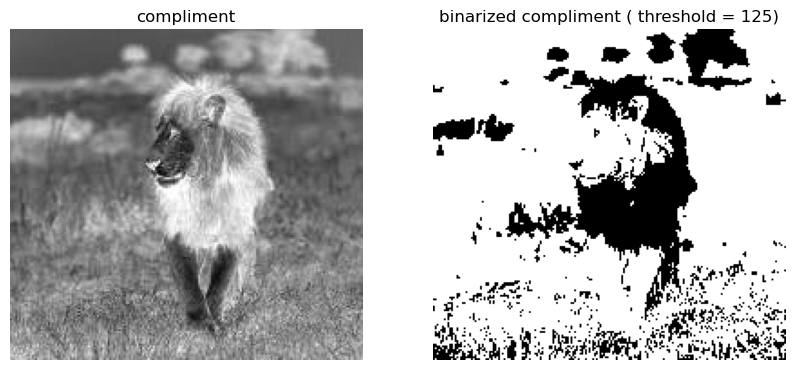

In [71]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(  compliment( IMG_2,  len(IMG_2), len(IMG_2[0])), cmap="gray")
ax[0].set_title("compliment")
ax[0].axis("off") 

ax[1].imshow(  binarize( New_IMG_2, len(New_IMG_2), len(New_IMG_2[0]) , 125), cmap="gray")
ax[1].set_title("binarized compliment ( threshold = 125)")
ax[1].axis("off") 

fig.set_size_inches(10, 5)
plt.show()

## 17|  Adding (and subtracting) the following values 10, 30,60, 200 from IMG2

In [73]:
def add_value(IMG, value):
    matrix = []
    
    for row in IMG:
        matrix_row = []
        
        for gray_value in row:
            
            new_value = gray_value + value
            
            new_value = min(max(new_value, 0), 255)
            
            matrix_row.append(new_value)
        
        matrix.append(matrix_row)
    
    return matrix


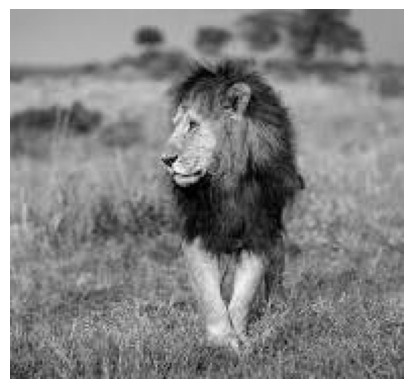

In [74]:
plt.imshow(IMG_2 ,  cmap='gray')
plt.axis("off" ) 
plt.show()

---

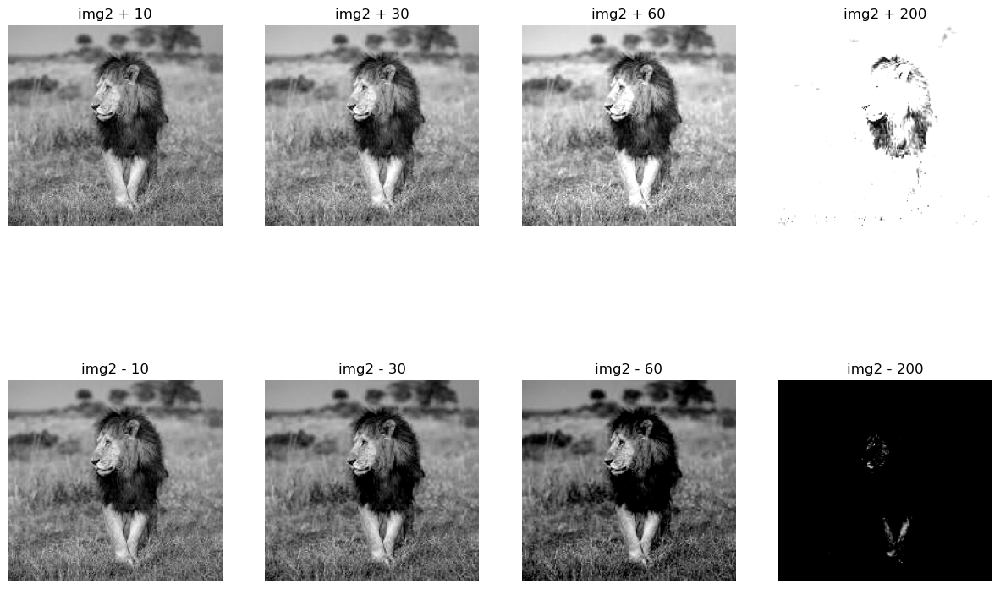

In [76]:
fig, ax = plt.subplots(2, 4)
ax[0, 0].imshow(add_value(IMG_2, value=10), cmap="gray")
ax[0, 0].set_title("img2 + 10")
ax[0, 0].axis("off")

ax[0, 1].imshow(add_value(IMG_2, value=30), cmap="gray")
ax[0, 1].set_title("img2 + 30")
ax[0, 1].axis("off")

ax[0, 2].imshow(add_value(IMG_2, value=60), cmap="gray")
ax[0, 2].set_title("img2 + 60")
ax[0, 2].axis("off")

ax[0, 3].imshow(add_value(IMG_2, value=200), cmap="gray")
ax[0, 3].set_title("img2 + 200")
ax[0, 3].axis("off")

ax[1, 0].imshow(add_value(IMG_2, value=-10), cmap="gray")
ax[1, 0].set_title("img2 - 10")
ax[1, 0].axis("off")

ax[1, 1].imshow(add_value(IMG_2, value=-30), cmap="gray")
ax[1, 1].set_title("img2 - 30")
ax[1, 1].axis("off")

ax[1, 2].imshow(add_value(IMG_2, value=-60), cmap="gray")
ax[1, 2].set_title("img2 - 60")
ax[1, 2].axis("off")

ax[1, 3].imshow(add_value(IMG_2, value=-200), cmap="gray")
ax[1, 3].set_title("img2 - 200")
ax[1, 3].axis("off")

fig.set_size_inches(15, 10)
plt.show()

## 18 | Multiply IMG2 by 1.7 and 0.6, respectively. 

In [78]:
def multiply_value(IMG, value):
    matrix = []
    
    for row in IMG:
        matrix_row = []
        
        for gray_value in row:
            
            new_value = gray_value * value
            
            new_value = min(max(new_value, 0), 255)
            
            matrix_row.append(new_value)
        
        matrix.append(matrix_row)
    
    return matrix

---

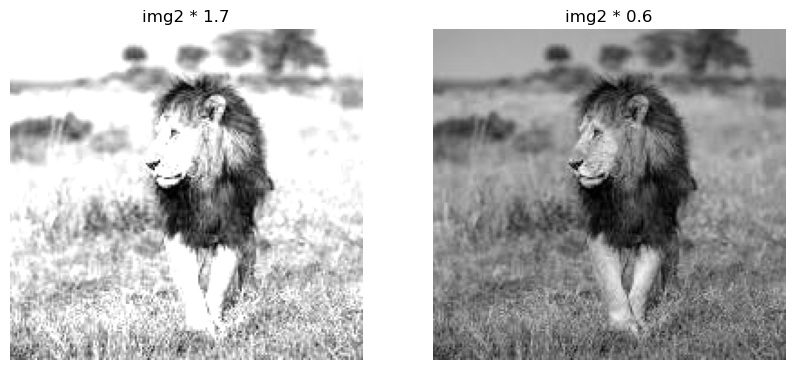

In [80]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(multiply_value(IMG_2, value=1.7), cmap="gray")
ax[0].set_title("img2 * 1.7")
ax[0].axis("off")

ax[1].imshow(multiply_value(IMG_2, value=0.6), cmap="gray")
ax[1].set_title("img2 * 0.6")
ax[1].axis("off")

fig.set_size_inches(10, 5)
plt.show()

## 19 | Devise the image on 2 and 0.5, respectively

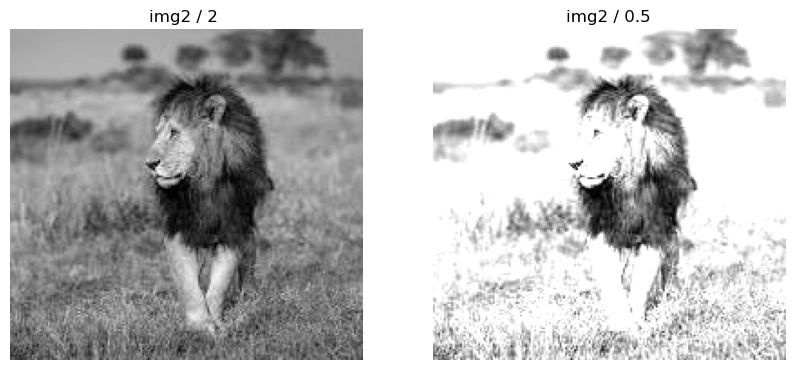

In [82]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(multiply_value(IMG_2, value=1/2), cmap="gray")
ax[0].set_title("img2 / 2 ")
ax[0].axis("off")

ax[1].imshow(multiply_value(IMG_2, value=1/0.5), cmap="gray")
ax[1].set_title("img2 / 0.5")
ax[1].axis("off")

fig.set_size_inches(10, 5)
plt.show()

---

# 20 |  Load the another image from your choice (IMG3)

In [85]:
path_image = "images/Canadian-elk.jpg"

In [86]:
image = Image.open(path_image) 

In [87]:
IMG_3 = np.array(image)

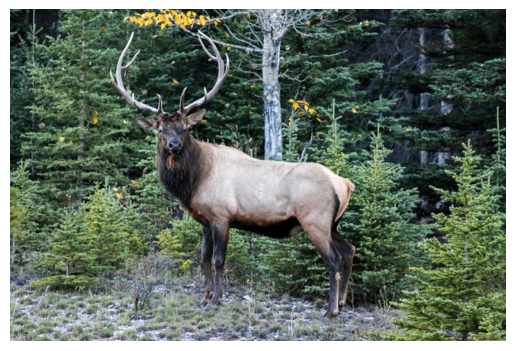

In [88]:
plt.imshow(IMG_3)
plt.axis("off") 
plt.show()

## Calculate the min / max (IMG2, IMG3) 

In [90]:
import numpy as np

def blank(m, n):
    return np.zeros((m, n), dtype=np.uint8)

In [91]:
def min_max(image1, image2):
    m = min(len(image1), len(image2))
    n = min(len(image1[0]), len(image2[0]))
    result_min = blank(m, n)
    result_max = blank(m, n)
    
    for i in range(m):
        for j in range(n):
            if image1[i][j] <= image2[i][j]:
                result_min[i][j] = image1[i][j]
                result_max[i][j] = image2[i][j]
            else:
                result_min[i][j] = image2[i][j]
                result_max[i][j] = image1[i][j]
    
    return result_min, result_max

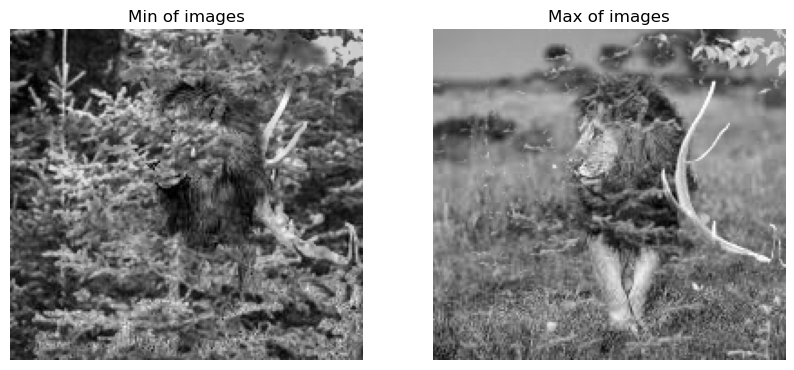

In [92]:
fig, ax = plt.subplots(1, 2)
min_image, max_image = min_max(image1=IMG_2, image2=gray_level_two(IMG_3 , len(IMG_3) , len(IMG_3[0])))
ax[0].imshow(min_image, cmap="gray")
ax[0].set_title("Min of images")
ax[0].axis("off")

ax[1].imshow(max_image, cmap="gray")
ax[1].set_title("Max of images")
ax[1].axis("off")

fig.set_size_inches(10, 5)
plt.show()

## 22 | Combining IMG2 and IMG3 linearly using (0.1, 0.9), (0.5, 0.5),(0.9, 0.1)

In [94]:
def linear_combination(image1 ,image2 ,a ,b ):
    h = min(len(image1), len(image2))
    w = min(len(image1[0]), len(image2[0])) 
    result = blank(h, w)
    for i in range(h):
        for j in range(w):
            result[i][j] = a * image1[i][j] + b * image2[i][j]

    return result

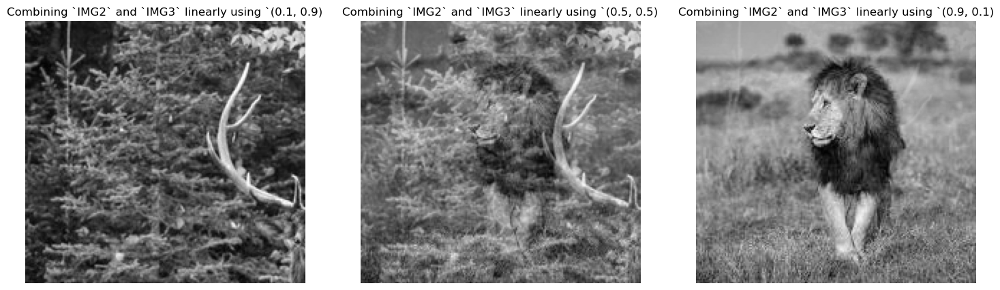

In [95]:
fig, ax = plt.subplots(1, 3)
ax[0].imshow(linear_combination(image1=IMG_2, image2=gray_level_two(IMG_3 , len(IMG_3) , len(IMG_3[0])) ,a=0.1 ,b=0.9), cmap="gray")
ax[0].set_title("Combining `IMG2` and `IMG3` linearly using `(0.1, 0.9)")
ax[0].axis("off")

ax[1].imshow(linear_combination(image1=IMG_2, image2=gray_level_two(IMG_3 , len(IMG_3) , len(IMG_3[0])) ,a=0.5 ,b=0.5), cmap="gray")
ax[1].set_title("Combining `IMG2` and `IMG3` linearly using `(0.5, 0.5)")
ax[1].axis("off")

ax[2].imshow(linear_combination(image1=IMG_2, image2=gray_level_two(IMG_3 , len(IMG_3) , len(IMG_3[0])) ,a=0.9 ,b=0.1), cmap="gray")
ax[2].set_title("Combining `IMG2` and `IMG3` linearly using `(0.9, 0.1)")
ax[2].axis("off")

fig.set_size_inches(18, 5)
plt.show()

## 23|  Creating two images containing squares

In [97]:
def create_square(image,x,y):
  result = copy.deepcopy(image)
  for i in range(x[0], x[1]):
    for j in range(y[0], y[1]):
      result[i][j] = 1
  return result

In [98]:
square_1 = create_square(
    image=blank(500,500), x=(50, 300), y=(50, 300) # x=(50, 300), y=(50, 300) 
)
square_2 = create_square(
    image=blank(500,500), x=(200, 450), y=(200, 450) # x=(200, 450), y=(200, 450)
)

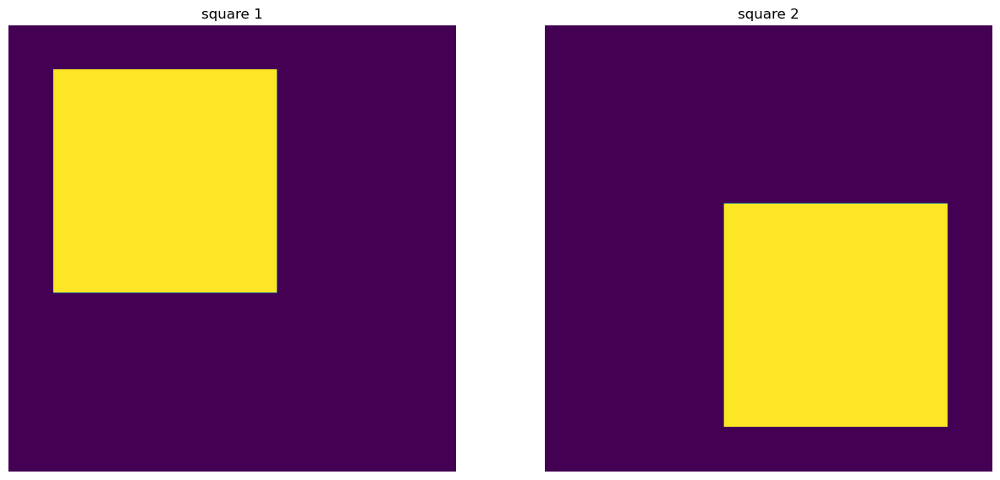

In [99]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(square_1)
ax[0].set_title("square 1")
ax[0].axis("off")

ax[1].imshow(square_2)
ax[1].set_title("square 2")
ax[1].axis("off")

fig.set_size_inches(15, 10)
plt.show()

## 24 | Performing the following logical operations: AND, OR, XOR, XNOR on the two image square

In [101]:
def image_and(image1, image2):
    result = copy.deepcopy(image1)
    m = len(image1)
    n = len(image1[0])
    for i in range(m):
        for j in range(n):
            result[i][j] = image1[i][j] and image2[i][j]
    return result


def image_or(image1, image2):
    result = copy.deepcopy(image1)
    m = len(image1)
    n = len(image1[0])
    for i in range(m):
        for j in range(n):
            result[i][j] = image1[i][j] or image2[i][j]
    return result


def image_xor(image1, image2):
    result = copy.deepcopy(image1)
    m = len(image1)
    n = len(image1[0])
    for i in range(m):
        for j in range(n):
            result[i][j] = image1[i][j] ^ image2[i][j]
    return result


def image_xnor(image1, image2):
    result = copy.deepcopy(image1)
    m = len(image1)
    n = len(image1[0])
    for i in range(m):
        for j in range(n):
            result[i][j] = ~(image1[i][j] ^ image2[i][j])
    return result

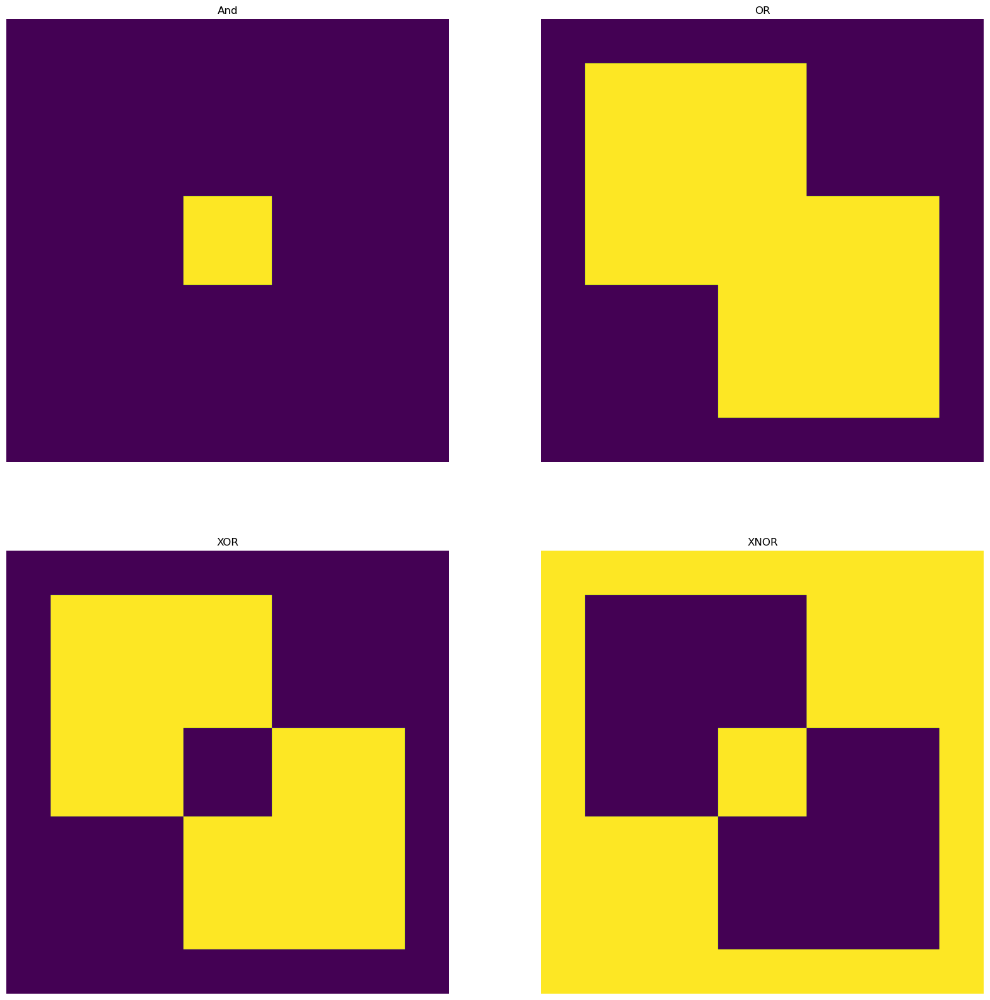

In [102]:
fig, ax = plt.subplots(2, 2)
ax[0,0].imshow(image_and(square_1,square_2))
ax[0,0].set_title("And")
ax[0,0].axis("off")

ax[0,1].imshow(image_or(square_1,square_2))
ax[0,1].set_title("OR")
ax[0,1].axis("off")

ax[1,0].imshow(image_xor(square_1,square_2))
ax[1,0].set_title("XOR")
ax[1,0].axis("off")

ax[1,1].imshow(image_xnor(square_1,square_2))
ax[1,1].set_title("XNOR")
ax[1,1].axis("off")

fig.set_size_inches(20, 20)
plt.show()

## 25 |  Generate two other binary images containing arbitrary shapes

In [104]:
def generate_binary(image):
    m = len(image)
    n = len(image[0])
    result = copy.deepcopy(image)
    for i in range(m):
        for j in range(n):
            result[i][j] = round(np.random.rand())
    return result

In [105]:
binary_image_1 = generate_binary(image = blank(50 , 50 ))
binary_image_2 = generate_binary(image = blank(50 , 50 ))

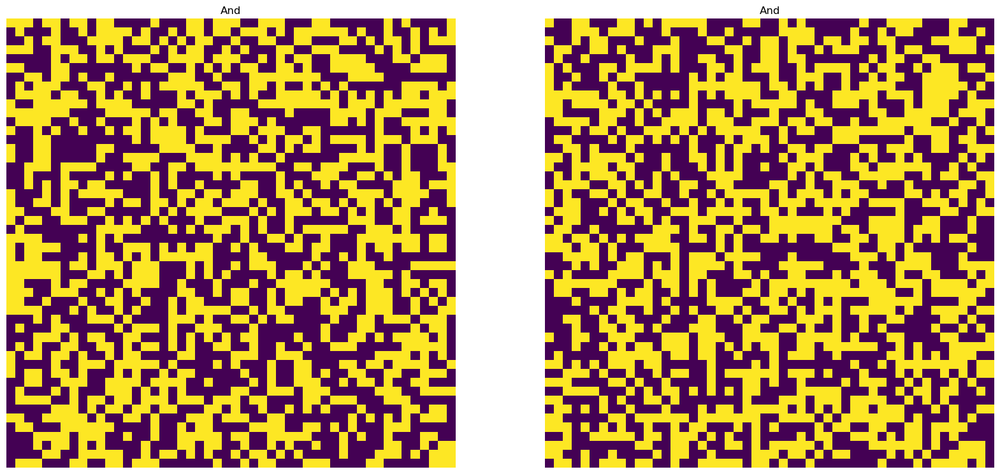

In [106]:
fig, ax = plt.subplots(1, 2)

ax[0].imshow(binary_image_1)
ax[0].set_title("And")
ax[0].axis("off")

ax[1].imshow(binary_image_2)
ax[1].set_title("And")
ax[1].axis("off")

fig.set_size_inches(20, 20)
plt.show()

---

## 26 | Performing the following operations: erosion, dilation, opening and closing on the image using a 3*3 square binary image as a structural element

In [109]:
def fitHit(structural_element, image_part):
    m = len(structural_element)
    n = len(structural_element[0])
    fit = True
    hit = False
    for i in range(m):
        for j in range(n):
            if (structural_element[i][j] == 1) and (image_part[i][j] == 0):
                fit = False
            if (structural_element[i][j] == 1) and (image_part[i][j] == 1):
                hit = True
    return fit, hit

In [110]:
def erosion_dilation(image, structural_element, operation):
    m = len(image)
    n = len(image[0])
    sm = len(structural_element)
    sn = len(structural_element[0])
    
    result = blank(m, n)
    for i in range(m - sm):
        for j in range(n - sn):
            image_part = [k[j : j + sn] for k in image[i : i + sm]]
            if operation == 0:
                if fitHit(structural_element, image_part)[0]:
                    result[i + np.ceil(sm / 2).astype(int)][
                        j + np.ceil(sn / 2).astype(int)
                    ] = 1
            elif operation == 1:
                if fitHit(structural_element, image_part)[1]:
                    result[i + np.ceil(sm / 2).astype(int)][
                        j + np.ceil(sn / 2).astype(int)
                    ] = 1
    return result

In [111]:
def opening_closing(image, structural_element, operation):
    if operation == 0:
        return erosion_dilation(erosion_dilation(image, structural_element, 0), structural_element, 1)
    
    elif operation == 1: # opening
        return erosion_dilation(erosion_dilation(image, structural_element, 1), structural_element, 0)

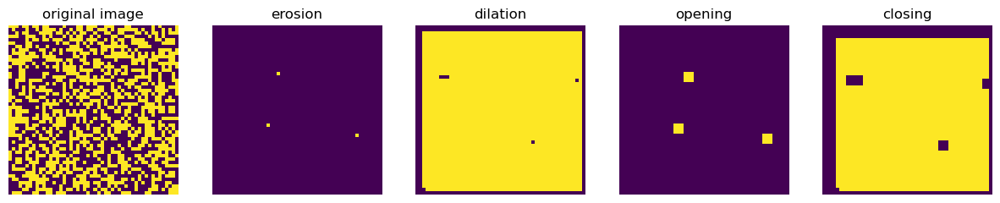

In [112]:
structural_element = [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
fig, ax = plt.subplots(1, 5)

ax[0].imshow(binary_image_1)
ax[0].set_title("original image")
ax[0].axis("off")


ax[1].imshow(
    erosion_dilation(
        image=binary_image_1, structural_element=structural_element, operation=0
    )
)
ax[1].set_title("erosion")
ax[1].axis("off")


ax[2].imshow(
    erosion_dilation(
        image=binary_image_1, structural_element=structural_element, operation=1
    )
)
ax[2].set_title("dilation")
ax[2].axis("off")

ax[3].imshow(
    opening_closing(image=binary_image_1, structural_element=structural_element, operation=0)
)
ax[3].set_title("opening")
ax[3].axis("off")

ax[4].imshow(
    opening_closing(image=binary_image_1, structural_element=structural_element, operation=1)
)
ax[4].set_title("closing")
ax[4].axis("off")


fig.set_size_inches(15, 10)
plt.show()

---

## 27 | Generate the gray-level histogram of IMG2

In [115]:
def pixel_values(image, value):
    m = len(image)
    n = len(image[0])
    count = 0
    for i in range(m):
        for j in range(n):
            if image[i][j] == value:
                count += 1
    return count

def gray_level_histogram(image):
    return [pixel_values(image, i) for i in range(256)]

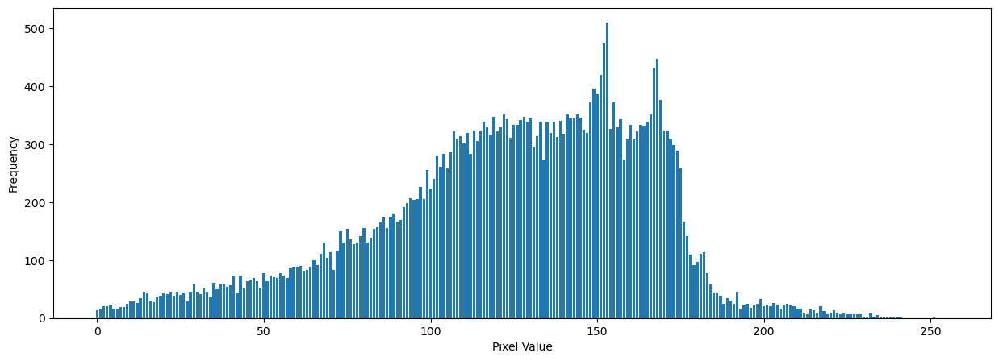

In [116]:
plt.figure(figsize=(15,5))
plt.bar(range(256), gray_level_histogram(IMG_2))
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

---

## 28| Adding 70 to all the image pixels, and comparing the histogram before and after

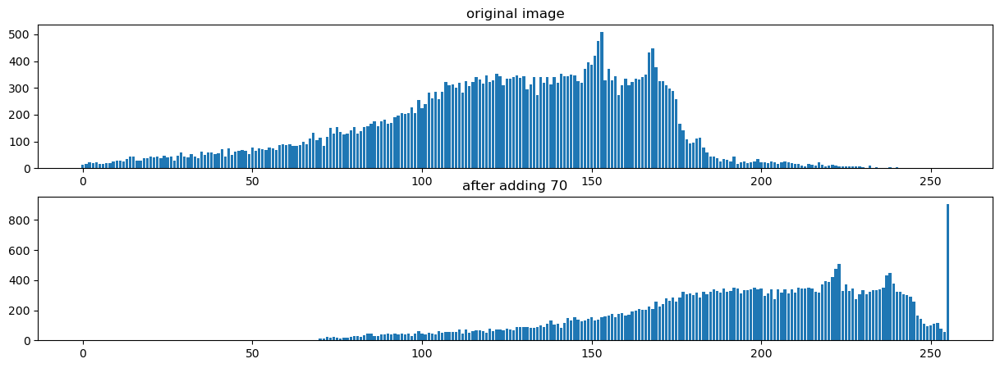

In [119]:
fig, ax = plt.subplots(2, 1)
fig.set_size_inches(15, 5)

ax[0].bar(range(256), gray_level_histogram(IMG_2))
ax[0].set_title("original image")


ax[1].bar(range(256), gray_level_histogram(add_value(IMG_2, 70)))
ax[1].set_title("after adding 70")

plt.show()

---

## 29 | Loading a low contrast image IMG4

In [122]:
path_image = "images/image-low-contrast.jpg" 

In [123]:
image = Image.open(path_image)

In [124]:
IMG_4 = np.array(image)

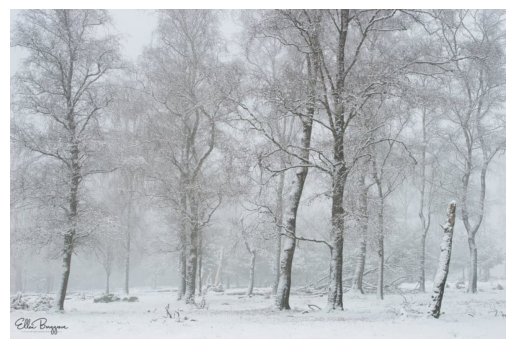

In [125]:
plt.imshow(IMG_4) 
plt.axis("off") 
plt.show()

In [126]:
G_IMG_4 = gray_level_two(IMG_4 , len(IMG_4) , len(IMG_4[0]))
G_IMG_4 = np.array(G_IMG_4)

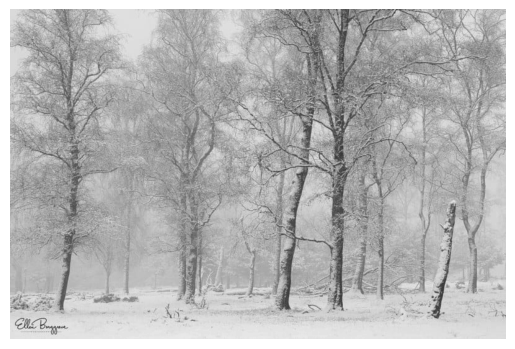

In [127]:
plt.imshow(G_IMG_4 , cmap='gray') 
plt.axis("off") 
plt.show()

---

## 30 | Apply the histogram stretching (the two formulas of course), and show the histogram before and after each process.

In [130]:
def histogram_stretching(image, r, formula):
    m = len(image)
    n = len(image[0])
    imin, imax = getMinMaxIntensity(image)
    rmin, rmax = r
    result = copy.deepcopy(image)
    if formula == 0:
        a = (rmax - rmin) / (imax - imin)
        b = rmax - a * imax
        for i in range(m):
            for j in range(n):
                result[i][j] = round(a * result[i][j] + b)
    elif formula == 1:
        for i in range(m):
            for j in range(n):
                result[i][j] = round(rmax * (result[i][j] - imin) / (imax - imin))
    return result

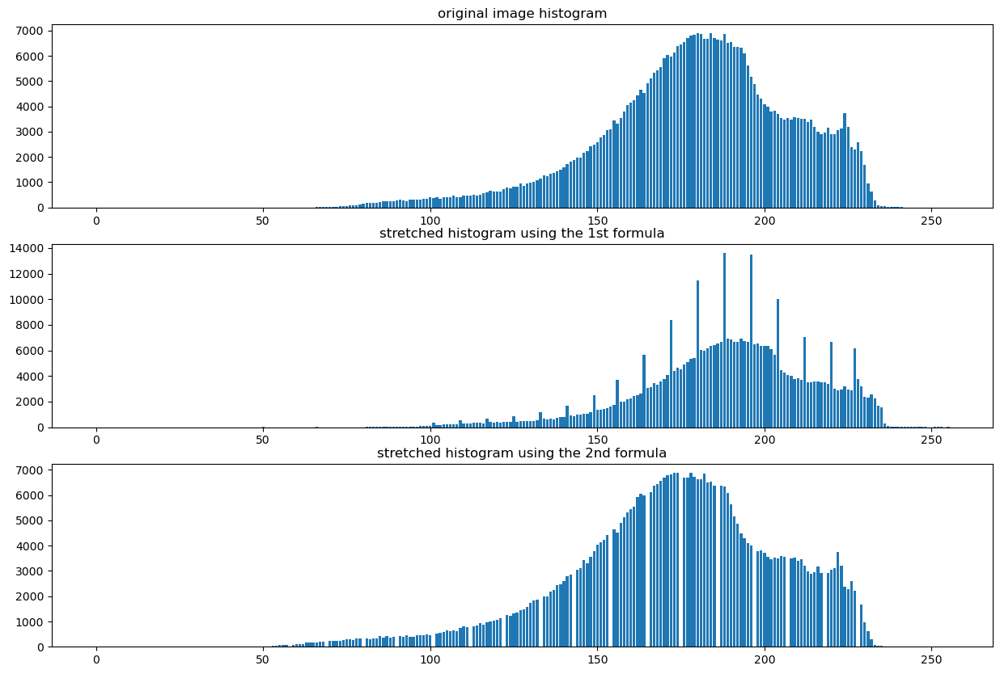

In [131]:
# fig, ax = plt.subplots(3, 1)
# fig.set_size_inches(15, 10)

# # First plot
# ax[0].bar(range(256), gray_level_histogram(G_IMG_4))
# ax[0].set_title("Stretched Histogram (1st Formula)")

# # Second plot
# ax[1].bar(range(256), gray_level_histogram(G_IMG_4, (50, 255), 0))
# ax[1].set_title("Stretched Histogram (1st Formula with Range)")

# # Third plot
# ax[2].bar(range(256), gray_level_histogram(G_IMG_4, (50, 255), 1))
# ax[2].set_title("Stretched Histogram (2nd Formula)")

# # Adjust layout
# plt.tight_layout()
# plt.show()
fig, ax = plt.subplots(3, 1)
fig.set_size_inches(15, 10)
ax[0].bar(range(256), gray_level_histogram(G_IMG_4))
ax[0].set_title("original image histogram")
ax[1].bar(range(256), gray_level_histogram(histogram_stretching(G_IMG_4, (50, 255), 0)))
ax[1].set_title("stretched histogram using the 1st formula")
ax[2].bar(range(256), gray_level_histogram(histogram_stretching(G_IMG_4, (50, 255), 1)))
ax[2].set_title("stretched histogram using the 2nd formula")
plt.show()

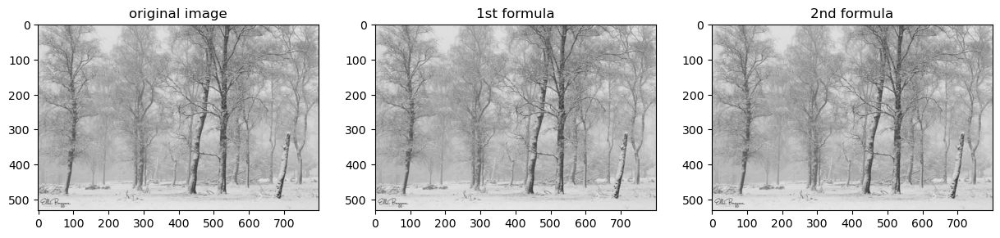

In [132]:
fig, ax = plt.subplots(1, 3)
fig.set_size_inches(15, 5)
ax[0].imshow(G_IMG_4, cmap="gray")
ax[0].set_title("original image")
ax[1].imshow(histogram_stretching(G_IMG_4, (50, 255), 0), cmap="gray")
ax[1].set_title("1st formula")
ax[2].imshow(histogram_stretching(G_IMG_4, (50, 255), 1), cmap="gray")
ax[2].set_title("2nd formula")
plt.show()

## 31| Applying Gamma correction on `IMG2`, where the values of Gamma are: `1.5, 4.2, 2.1`


In [134]:
def gammaCorrection(image, ld):
    m, n = getHeight(image), getWidth(image)
    result = copy.deepcopy(image)
    for i in range(m):
        for j in range(n):
            result[i][j] = result[i][j] ** ld

    return result

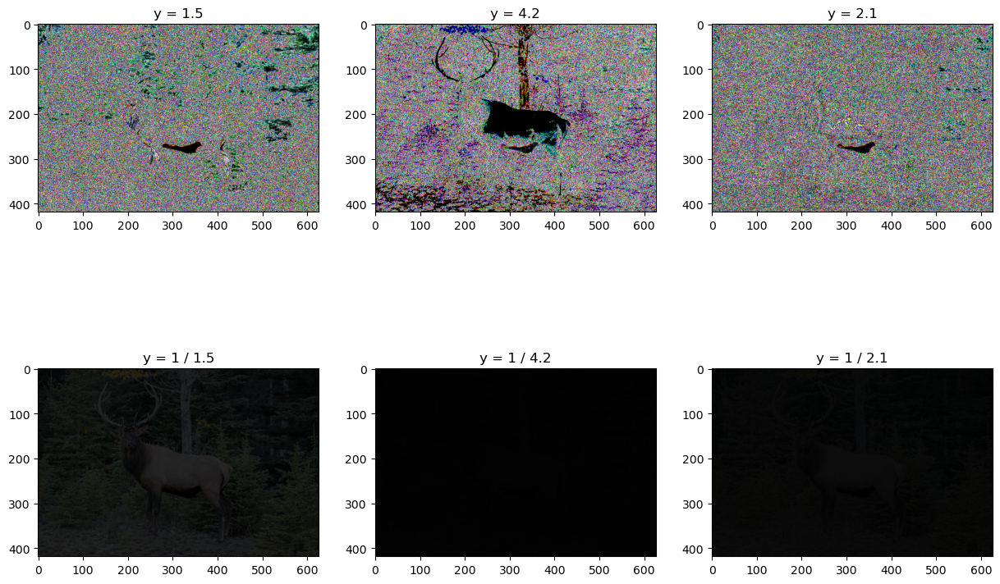

In [135]:
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(gammaCorrection(IMG_3, 1.5), cmap="gray")
ax[0, 0].set_title("y = 1.5")
ax[0, 1].imshow(gammaCorrection(IMG_3, 4.2), cmap="gray")
ax[0, 1].set_title("y = 4.2")
ax[0, 2].imshow(gammaCorrection(IMG_3, 2.1), cmap="gray")
ax[0, 2].set_title("y = 2.1")
ax[1, 0].imshow(gammaCorrection(IMG_3, 1 / 1.5), cmap="gray")
ax[1, 0].set_title("y = 1 / 1.5")
ax[1, 1].imshow(gammaCorrection(IMG_3, 1 / 4.2), cmap="gray")
ax[1, 1].set_title("y = 1 / 4.2")
ax[1, 2].imshow(gammaCorrection(IMG_3, 1 / 2.1), cmap="gray")
ax[1, 2].set_title("y = 1 / 2.1")
plt.show()

## 32| Applying the algorithm of histogram equalization on `IMG4`, and showing the histogram before and after


In [137]:
def CDF(pmf):
    cdf = [0] * len(pmf)
    cdf[0] = pmf[0]
    for i in range(1, len(pmf)):
        cdf[i] = cdf[i - 1] + pmf[i]
    return cdf


def histogramEqualization(image, lmax):
    hc =  gray_level_histogram(G_IMG_4 )
    pmf = [i / sum(hc) for i in hc]
    cdf = CDF(pmf)
    cdfLmax = [i * lmax for i in cdf]
    m, n = getHeight(image), getWidth(image)
    result = copy.deepcopy(image)
    for i in range(m):
        for j in range(n):
            result[i][j] = round(cdfLmax[int(image[i][j])])
    return result

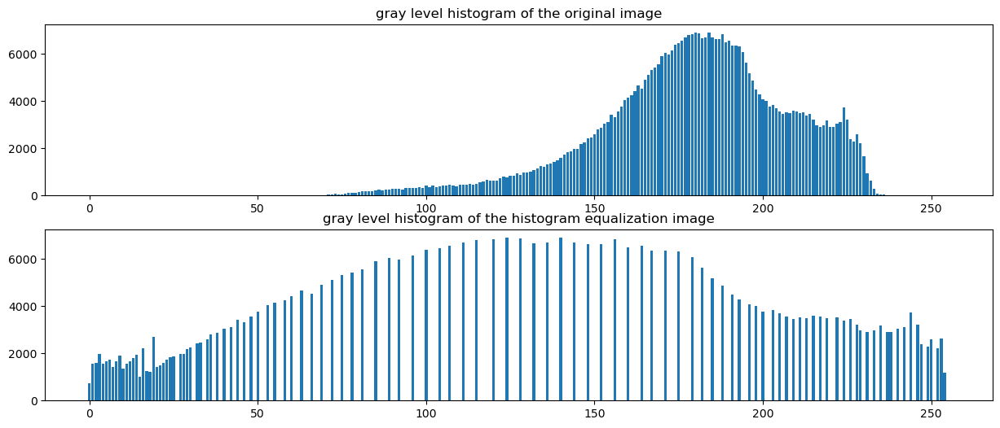

In [138]:
fig, ax = plt.subplots(2, 1)
fig.set_size_inches(15, 6)
ax[0].bar(range(256), gray_level_histogram(G_IMG_4))
ax[0].set_title("gray level histogram of the original image")
ax[1].bar(range(256), gray_level_histogram(histogramEqualization(G_IMG_4,getMinMaxIntensity(G_IMG_4)[1])))
ax[1].set_title("gray level histogram of the histogram equalization image")
plt.show()

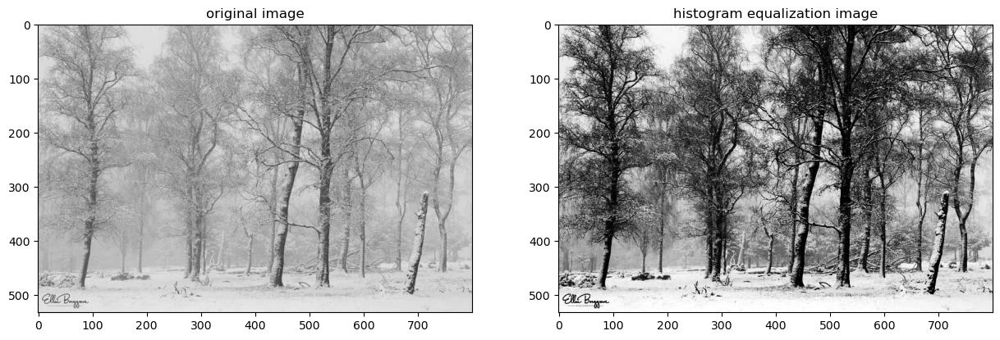

In [139]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(15, 5)
ax[0].imshow(G_IMG_4, cmap="gray")
ax[0].set_title("original image")
ax[1].imshow(histogramEqualization(G_IMG_4, getMinMaxIntensity(G_IMG_4)[1]), cmap="gray")
ax[1].set_title("histogram equalization image")
plt.show()

## 33| Loading `IMG5`


In [178]:

IMG5 = cv2.imread("./images/IMG5.jpeg")
img5 = cv2.cvtColor(IMG5, cv2.COLOR_BGR2RGB) # This line con

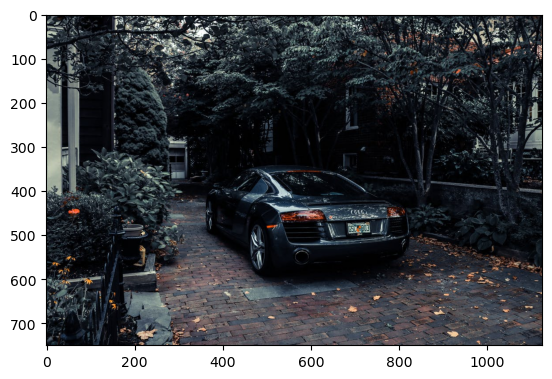

In [180]:
plt.imshow(img5)

## 34| Adding a salt, pepper, salt-pepper, Gaussian noise to `IMG5`


In [183]:
def salt(image, density):
    m, n = getHeight(image), getWidth(image)
    result = copy.deepcopy(image)
    for i in range(density):
        result[round(np.random.randint(m))][round(np.random.randint(n))] = [
            255,
            255,
            255,
        ]
    return result


def pepper(image, density):
    m, n = getHeight(image), getWidth(image)
    result = copy.deepcopy(image)
    for i in range(density):
        result[round(np.random.randint(m))][round(np.random.randint(n))] = [0, 0, 0]
    return result


def saltPepper(image, density):
    return pepper(salt(image, density), density)


def gaussianNoise(image, density):
    m, n = getHeight(image), getWidth(image)
    result = copy.deepcopy(image)
    for index in range(density):
        i, j = round(np.random.randint(m)), round(np.random.randint(n))
        random = round(np.random.normal() * 255)
        result[i][j][0] = np.clip(result[i][j][0] + random, 0, 255)
        result[i][j][1] = np.clip(result[i][j][1] + random, 0, 255)
        result[i][j][2] = np.clip(result[i][j][2] + random, 0, 255)
    return result

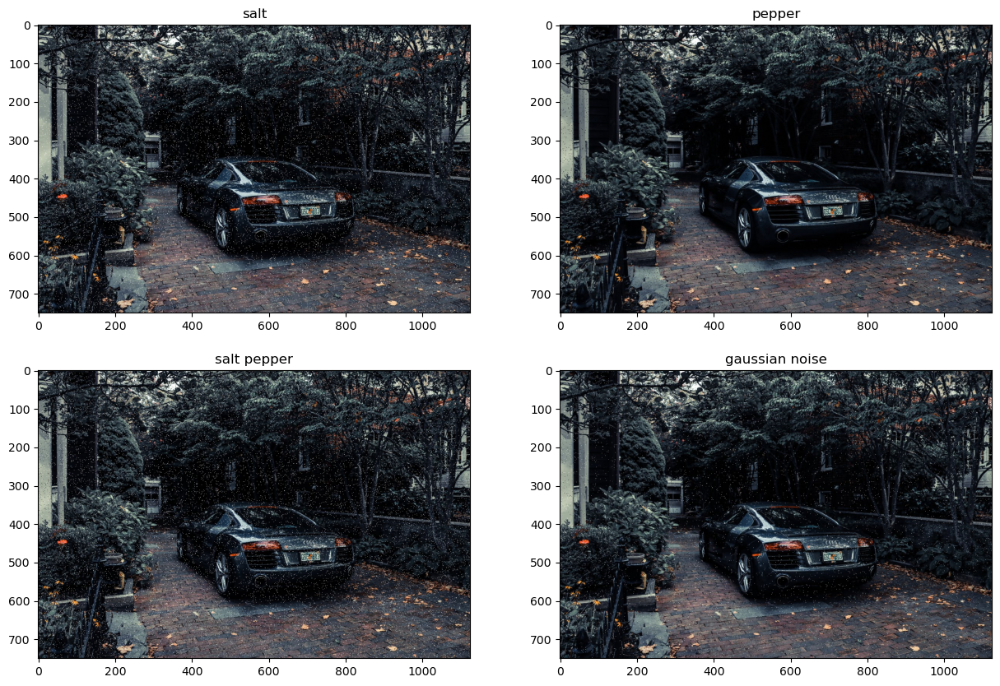

In [185]:
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(salt(img5, 20000))
ax[0, 0].set_title("salt")
ax[0, 1].imshow(pepper(img5, 20000))
ax[0, 1].set_title("pepper")
ax[1, 0].imshow(saltPepper(img5, 20000))
ax[1, 0].set_title("salt pepper")
ax[1, 1].imshow(gaussianNoise(img5, 20000))
ax[1, 1].set_title("gaussian noise")
plt.show()

## 35| Applying mean and Gaussian filters on the noisy versions of `IMG5`


In [188]:
def neighborhood(size):
    if size%2==0 :size +=1
    return [[(np.power(size,2)) for i in range(size)] for j in range(size)]

def meanFilter(image, size):
    npImage = np.array(image)
    filter = np.array(neighborhood((size)))
    img = np.array(image)
    
    for i in range(len(image) - size + 1):
        for j in range(len(image[0]) - size + 1):
            conv = np.array(npImage[i:i+size, j:j+size])
            result = np.sum(np.divide(conv, filter))
            img[i+size//2][j+size//2] = result 
        
    return img

def gaussianFunction(x,y,sigma):
    return ((1/(2*np.pi*(np.power(sigma,2)))*(np.exp(-1*((np.power(x,2)+np.power(y,2))/(2*np.power(sigma,2)))))))

def Gneighborhood(size , sigma):
    if size%2==0 :size +=1
    filter = [[ gaussianFunction(i - ((size - 1) / 2), j - ((size - 1) / 2), sigma) for i in range(size)] for j in range(size)]
    if(np.sum(filter) != 1):
        filter = np.divide(filter, np.full_like(filter, np.sum(filter)))
    return filter

    
def gaussianFilter(image, size, sigma):
    npImage = np.array(image)
    filter = np.array(Gneighborhood(size,sigma))
    img = np.array(image)
    
    for i in range(len(image) - size + 1):
        for j in range(len(image[0]) - size + 1):
            conv = np.array(npImage[i:i+size, j:j+size])
            result = np.sum(np.divide(conv, filter))
            img[i+size//2][j+size//2] = result 
        
    return img

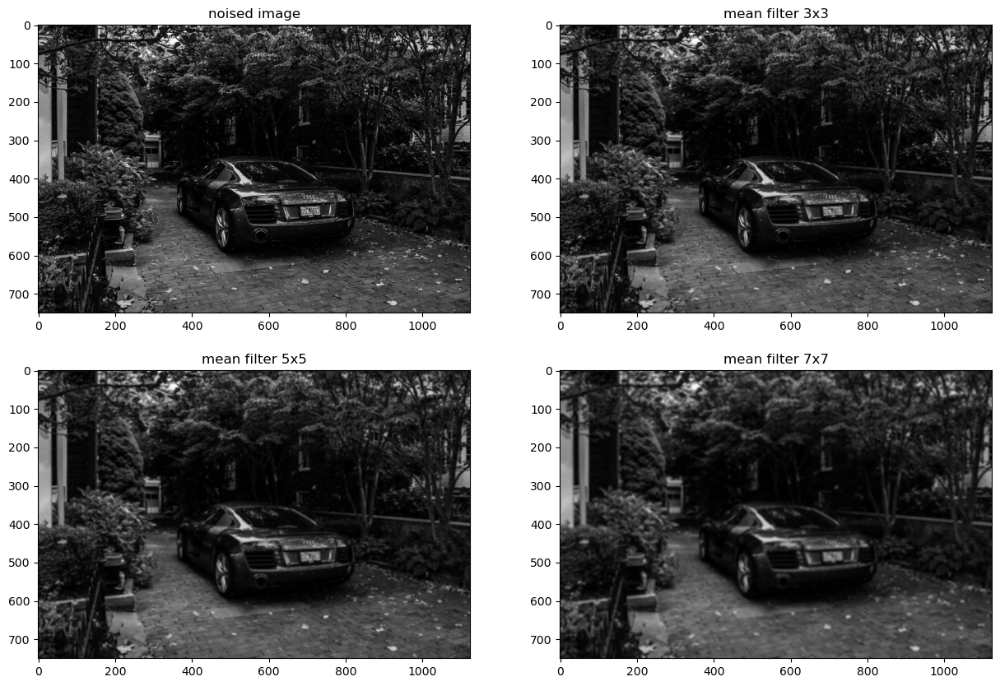

In [207]:
test = grayLevelAverageMethod(salt(img5,1000))
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(test,cmap="gray")
ax[0, 0].set_title("noised image")
ax[0, 1].imshow(meanFilter(test,3),cmap="gray")
ax[0, 1].set_title("mean filter 3x3")
ax[1, 0].imshow(meanFilter(test,5),cmap="gray")
ax[1, 0].set_title("mean filter 5x5")
ax[1, 1].imshow(meanFilter(test,7),cmap="gray")
ax[1, 1].set_title("mean filter 7x7")
plt.show()

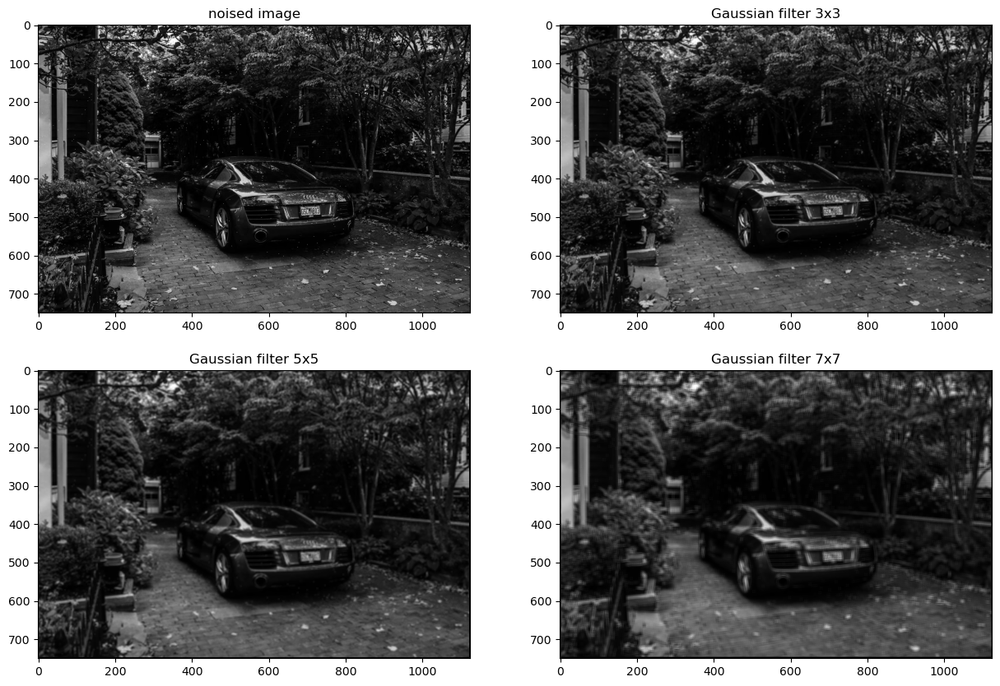

In [208]:
test = grayLevelAverageMethod(salt(img5,1000))
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
sigma = 2
ax[0, 0].imshow(test,cmap="gray")
ax[0, 0].set_title("noised image")
ax[0, 1].imshow(gaussianFilter(test,3,sigma),cmap="gray")
ax[0, 1].set_title("Gaussian filter 3x3")
ax[1, 0].imshow(gaussianFilter(test,5,sigma),cmap="gray")
ax[1, 0].set_title("Gaussian filter 5x5")
ax[1, 1].imshow(gaussianFilter(test,7,sigma),cmap="gray")
ax[1, 1].set_title("Gaussian filter 7x7")
plt.show()

## 36| Applying the median filter with a neighborhood of `3,5` and `7`, respectively.


In [210]:
def medianFilter(image, size):
    NpImg = np.array(image)
    img = np.array(image)
    for i in range(len(image)-size+1):
        for j in range(len(image[0])-size+1):
            conv = np.array(NpImg[i:i+size, j:j+size])
            conv = np.sort(conv.flatten())
            img[i+size//2][j+size//2] = conv[(len(conv)//2)+1]
            
    
    return img

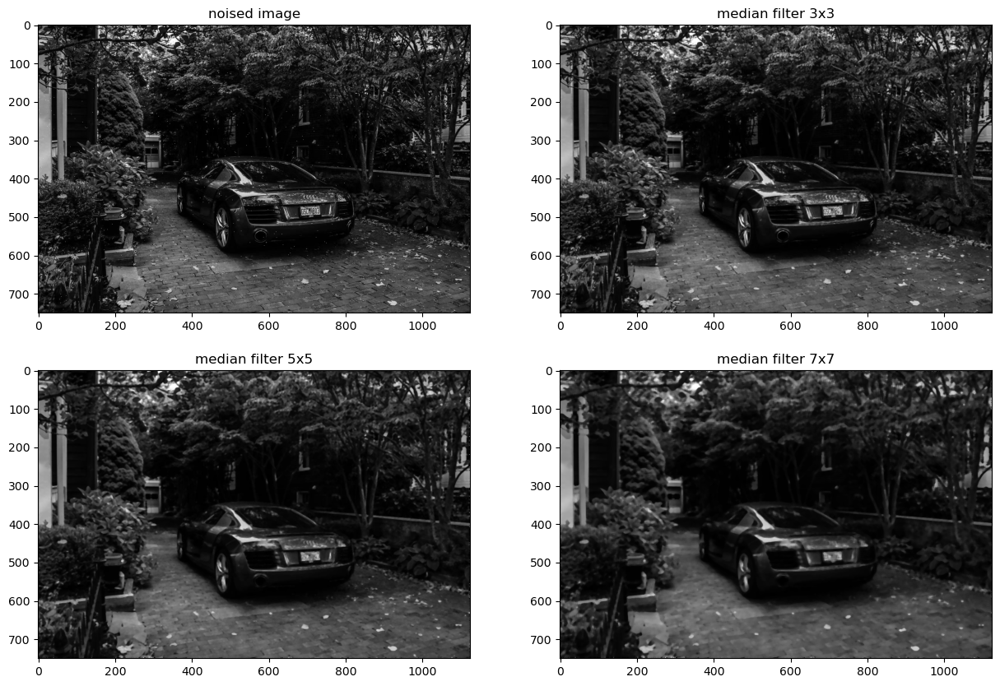

In [211]:
test = grayLevelAverageMethod(salt(img5,1000))
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(test,cmap="gray")
ax[0, 0].set_title("noised image")
ax[0, 1].imshow(medianFilter(test,3),cmap="gray")
ax[0, 1].set_title("median filter 3x3")
ax[1, 0].imshow(medianFilter(test,5),cmap="gray")
ax[1, 0].set_title("median filter 5x5")
ax[1, 1].imshow(medianFilter(test,7),cmap="gray")
ax[1, 1].set_title("median filter 7x7")
plt.show()

## 37| Applying Sobel operator on `IMG5`, and showing the horizontal, vertical and the final edge


In [213]:
def sobel(image):
    img = np.array(image)
    Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    Gy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    sobelX = np.array(blank(len(image), len(image[0])))
    sobelY = np.array(blank(len(image), len(image[0])))

    for i in range(len(img) - 2):
        for j in range(len(img[0]) - 2):
            conv = np.array(img[i : i + 3, j : j + 3])
            gradient_x = np.sum(np.multiply(conv, Gx))
            gradient_y = np.sum(np.multiply(conv, Gy))

            sobelX[i + 1][j + 1] = gradient_x
            sobelY[i + 1][j + 1] = gradient_y

    Mag = np.hypot(sobelX, sobelY)

    orientation = np.where(sobelY != 0, np.arctan2(sobelX, sobelY), np.pi/2)
    orientation_degrees = np.degrees(orientation)

    return sobelX, sobelY, Mag, orientation_degrees

def SobelPrinter(image, grad_x, grad_y):
    sobelx, sobely = sobel(image)[:2]
    X,Y=np.array(blank(len(image), len(image[0]))),np.array(blank(len(image), len(image[0])))
    for i in range(len(image) - 2):
        for j in range(len(image[0]) - 2):
            
            if abs(sobelx[i+1][j+1]) > grad_x:
                X[i + 1][j + 1] = 255

            if abs(sobely[i + 1][j + 1]) > grad_y:
                Y[i + 1][j + 1] = 255
                
    sobelf = X + Y
    sobelf = np.where((X == 0) & (Y == 0), 0, 255)
    return X, Y, sobelf

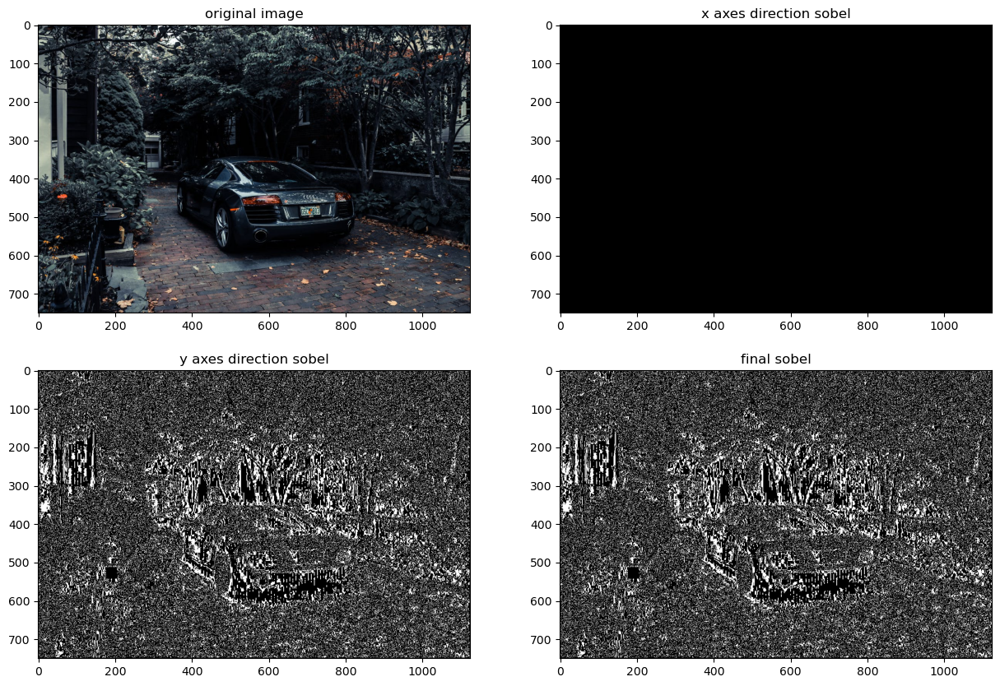

In [214]:
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
sobelX, sobely, sobelf  = SobelPrinter(img5, 2800, 200)
ax[0,0].imshow(img5,cmap="gray")
ax[0,0].set_title("original image")
ax[0,1].imshow(sobelX,cmap="gray")
ax[0,1].set_title("x axes direction sobel")
ax[1,0].imshow(sobely,cmap="gray")
ax[1,0].set_title("y axes direction sobel")
ax[1,1].imshow(sobelf,cmap="gray")
ax[1,1].set_title("final sobel")
plt.show()

## 38| Showing the gradient magnitude image of `IMG5`, and threshold it using `10, 50, 120, 190` and showing the resulting images


In [216]:
def gradient_magnitude(image, threshold):
    img = np.array(image)
    Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    Gy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    grad_mag = np.array(img)

    for i in range(len(img) - 2):
        for j in range(len(img[0]) - 2):
            conv = np.array(img[i : i + 3, j : j + 3])
            gradient_x = np.sum(np.multiply(conv, Gx))
            gradient_y = np.sum(np.multiply(conv, Gy))

            mag = np.sqrt(np.power(gradient_x, 2) + np.power(gradient_y, 2))
            if mag > threshold:
                grad_mag[i + 1][j + 1] = mag

    return np.clip(grad_mag, 0, 255)

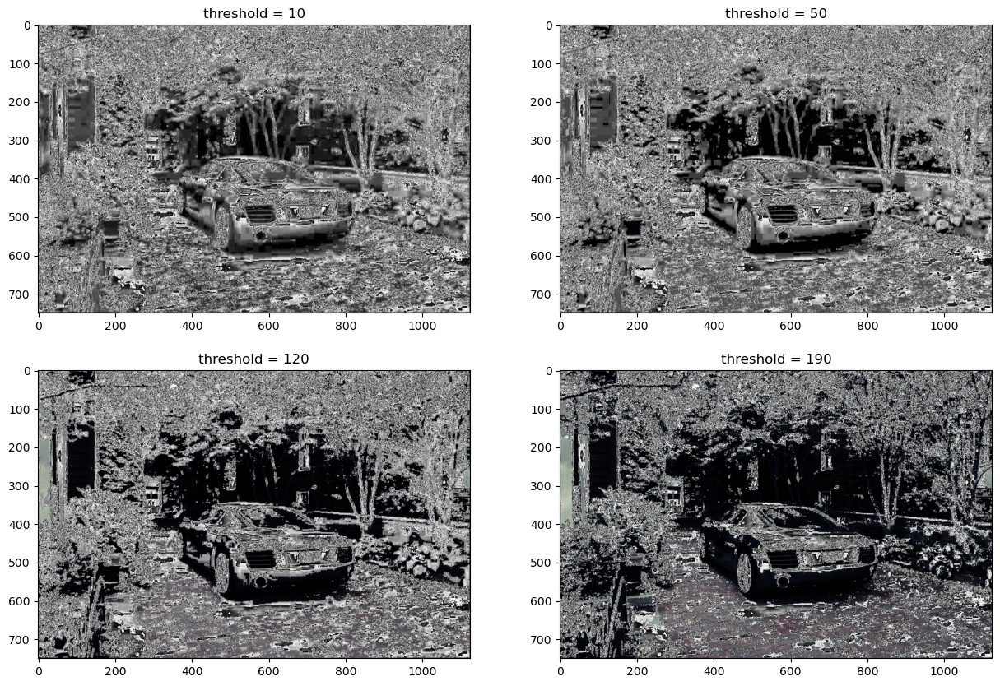

In [217]:
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(gradient_magnitude(img5, 10), cmap="gray")
ax[0, 0].set_title("threshold = 10")
ax[0, 1].imshow(gradient_magnitude(img5, 50), cmap="gray")
ax[0, 1].set_title("threshold = 50")
ax[1, 0].imshow(gradient_magnitude(img5, 120), cmap="gray")
ax[1, 0].set_title("threshold = 120")
ax[1, 1].imshow(gradient_magnitude(img5, 190), cmap="gray")
ax[1, 1].set_title("threshold = 190")
plt.show()

## 39| Showing the edge image in which the pixels kept only with the maximum of gradient in the gradient direction


In [219]:
def sobelMax(image):
    img = np.array(image)
    Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    Gy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    sobelX = np.zeros_like(img)
    sobelY = np.zeros_like(img)

    for i in range(len(img) - 2):
        for j in range(len(img[0]) - 2):
            conv = np.array(img[i : i + 3, j : j + 3])
            sobelX[i + 1, j + 1] = np.sum(np.multiply(conv, Gx))
            sobelY[i + 1, j + 1] = np.sum(np.multiply(conv, Gy))

    sobelMax = np.maximum(np.abs(sobelX), np.abs(sobelY))

    return np.clip(sobelMax, 0, 255)

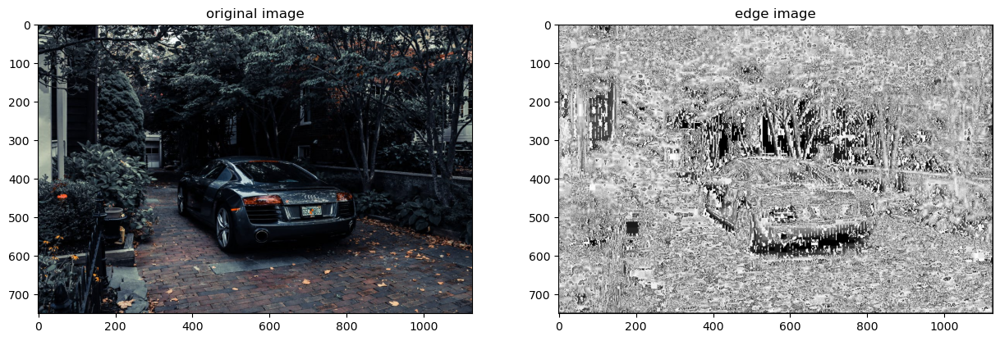

In [220]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(15, 5)
ax[0].imshow(img5, cmap="gray")
ax[0].set_title("original image")
ax[1].imshow(sobelMax(img5), cmap="gray")
ax[1].set_title("edge image")
plt.show()

## 40| Detect the edges in `IMG5` using canny algorithm


In [222]:
def Canny(image, Tlow, Thigh):
    m = getHeight(image)
    n = getWidth(image)
    result = np.array(blank(m, n))
    FiltredImage = gaussianFilter(image, 3, sigma=1)
    Magnitude, Orientation = sobel(FiltredImage)[2:4]
    Orientation = Binning(Orientation)
    for i in range(m - 2):
        for j in range(n - 2):
            neighborhood_3 = np.array(Magnitude[i : i + 3, j : j + 3])
            neighborhood_5 = np.array(Magnitude[i - 1 : i + 4, j - 1 : j + 4])
            if Orientation[i + 1][j + 1] == 0:
                if HysteresisThresholding(
                    Magnitude[i + 1][j + 1],
                    Magnitude[i + 1][j],
                    Magnitude[i + 1][j + 2],
                    Tlow,
                    Thigh,
                    neighborhood_3,
                    neighborhood_5,
                    i,
                    j,
                    m,
                    n,
                ):
                    result[i + 1][j + 1] = 255

            elif Orientation[i + 1][j + 1] == 90:
                if HysteresisThresholding(
                    Magnitude[i + 1][j + 1],
                    Magnitude[i][j + 1],
                    Magnitude[i + 2][j + 1],
                    Tlow,
                    Thigh,
                    neighborhood_3,
                    neighborhood_5,
                    i,
                    j,
                    m,
                    n,
                ):
                    result[i + 1][j + 1] = 255

            elif Orientation[i + 1][j + 1] == 45:
                if HysteresisThresholding(
                    Magnitude[i + 1][j + 1],
                    Magnitude[i][j + 2],
                    Magnitude[i + 2][j],
                    Tlow,
                    Thigh,
                    neighborhood_3,
                    neighborhood_5,
                    i,
                    j,
                    m,
                    n,
                ):
                    result[i + 1][j + 1] = 255
            else:
                if HysteresisThresholding(
                    Magnitude[i + 1][j + 1],
                    Magnitude[i][j],
                    Magnitude[i + 2][j + 2],
                    Tlow,
                    Thigh,
                    neighborhood_3,
                    neighborhood_5,
                    i,
                    j,
                    m,
                    n,
                ):
                    result[i + 1][j + 1] = 255

    return result


def HysteresisThresholding(
    Mag, MagB, MagF, Tlow, Thigh, neighborhood_3, neighborhood_5, i, j, m, n
):
    if (Mag > MagB) and (Mag > MagF):
        if Mag > Thigh:
            return True
        elif (Mag <= Thigh) and (Mag >= Tlow):
            if np.any(neighborhood_3 > Thigh):
                return True
            elif (
                np.any(neighborhood_3 <= Thigh)
                and (np.any(neighborhood_3 >= Tlow))
                and (i > 1 and j > 1)
                and (i < m - 3 and j < n - 3)
            ):
                if np.any(neighborhood_5 > Thigh):
                    return True
    return False


def Binning(Orientation):
    Orientation += np.where(Orientation < 0, 180, 0)
    Orientation = np.where(
        (Orientation >= 157.5) | (Orientation < 22.5),
        0,
        np.where(
            (Orientation >= 22.5) & (Orientation < 67.5),
            45,
            np.where(
                (Orientation >= 67.5) & (Orientation < 122.5),
                90,
                np.where(
                    (Orientation >= 122.5) & (Orientation < 157.5), 135, Orientation
                ),
            ),
        ),
    )
    return Orientation

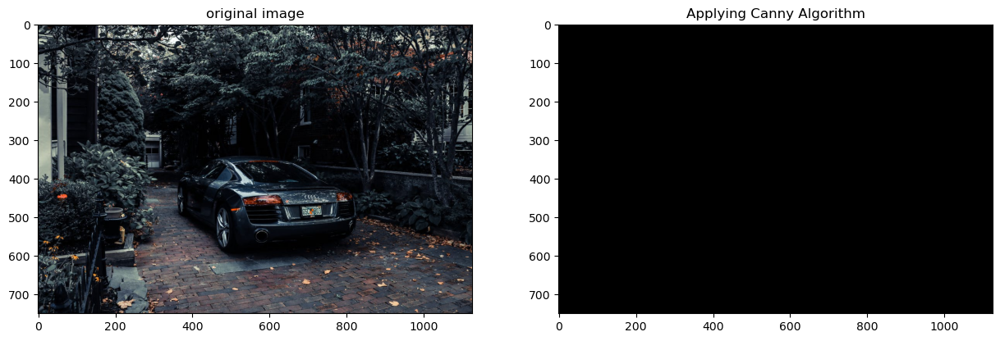

In [223]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(15, 5)
ax[0].imshow(img5, cmap="gray")
ax[0].set_title("original image")
ax[1].imshow(Canny(img5,8400,65400), cmap="gray")
ax[1].set_title("Applying Canny Algorithm")
plt.show()